# Genre Classification of Audio Signals Using Neural Networks

## Project Overview

The primary goal of this project is to develop an audio classifier that accurately identifies and categorizes songs into one of ten predefined music genres: blues, classical, country, disco, hip-hop, jazz, metal, pop, reggae, and rock. By leveraging deep learning techniques, the project aims to analyze audio signals and extract meaningful features for effective classification.

Dataset: https://www.kaggle.com/datasets/andradaolteanu/gtzan-dataset-music-genre-classification

## Project Owner: Manuel Contreras

### 1 - Libraries

In [53]:
# Data Manipulation
import os
import numpy as np
import pandas as pd

# Audio Processing
import librosa
import librosa.display
from pydub import AudioSegment
import IPython.display as ipd  # For displaying audio in Jupyter Notebooks

# Data Visualization
import matplotlib.pyplot as plt

# Machine Learning & Neural Networks
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, Activation, BatchNormalization, Flatten, Conv1D, MaxPooling1D
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
from tensorflow.keras.utils import to_categorical
from tensorflow import keras
from tensorflow.keras import layers
from keras import regularizers
from keras import models

# Preprocessing & Model Evaluation
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.metrics import precision_score, recall_score, f1_score

# Progress Bar
from tqdm import tqdm

# Warnings Control
import warnings
warnings.filterwarnings('ignore')

### 2 - Data Import

In [2]:
# Path to the audio folders
base_folder_path = r'C:\Users\manue\Desktop\DataScience\Audio\genres_original'
folders = ['Blues', 'classical', 'country', 'disco', 'hiphop', 'jazz', 'metal', 'pop', 'reggae', 'rock']

In [3]:
# Empty list to hold audio data information
audio_data = []

In [4]:
# Loop through each folder and load audio files
for folder in folders:
    folder_path = os.path.join(base_folder_path, folder)
    
    # Get all audio files in the folder
    audio_files = [f for f in os.listdir(folder_path) if f.endswith(('.wav', '.mp3'))]
    
    for audio_file in audio_files:
        audio_path = os.path.join(folder_path, audio_file)
        
        try:
            # Load the audio file
            y, sr = librosa.load(audio_path, sr=None)
            
            # Append relevant information to the list
            audio_data.append({
                'file_name': audio_file,
                'folder': folder
            })
        
        except Exception as e:
            print(f"Error loading {audio_path}: {e}")

Error loading C:\Users\manue\Desktop\DataScience\Audio\genres_original\jazz\jazz.00054.wav: 


In [5]:
# The df is correctly showing all the audio files as well as the category to which they belong
df = pd.DataFrame(audio_data)
df.head()

,file_name,folder
0,blues.00000.wav,Blues
1,blues.00001.wav,Blues
2,blues.00002.wav,Blues
3,blues.00003.wav,Blues
4,blues.00004.wav,Blues


In [6]:
rows, columns = df.shape
print(f"The dataset has {columns} columns and {rows} rows.")

The dataset has 2 columns and 999 rows.


### 3 - Setup

The purpose of the code below is to prevent Out-Of-Memory (OOM) errors by controlling how TensorFlow allocates memory on a GPU.

In [7]:
# This is to avoid OOM errors by setting GPU Memory Consumption Growth
gpus = tf.config.experimental.list_physical_devices('GPU')  # List for all available GPUs available on the system that TensorFlow can access.
for gpu in gpus: 
    tf.config.experimental.set_memory_growth(gpu, True)  # memory growth for each GPU

TensorFlow by default pre-allocates the entire GPU memory at once, which can lead to Out-Of-Memory (OOM) errors, especially if other processes are running on the GPU or the model doesn't require all the memory. Setting memory_growth to True makes TensorFlow allocate memory gradually, starting small and increasing as needed during model training or inference. This helps to avoid using more GPU memory than necessary and prevents OOM errors.

In [8]:
tf.config.list_physical_devices('GPU')

[]

### 3 - Data Visualization and Data Preparation

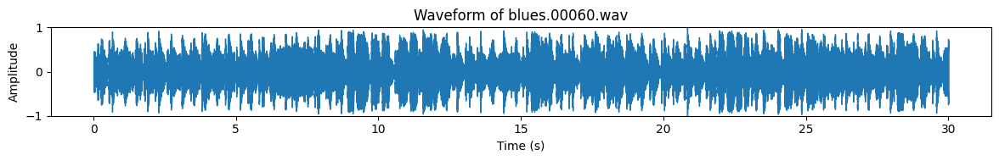

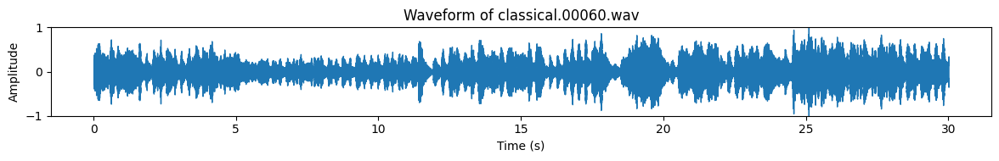

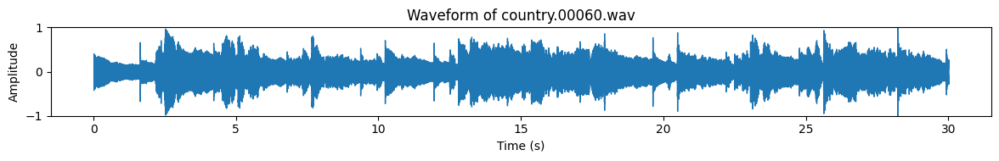

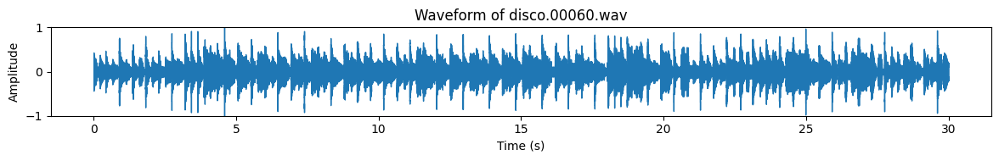

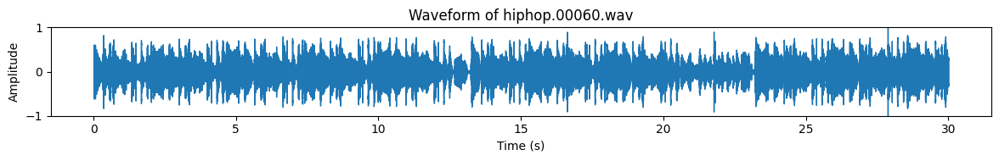

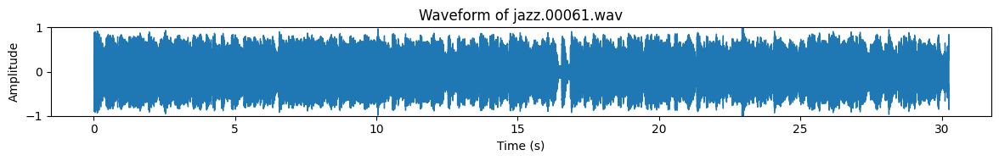

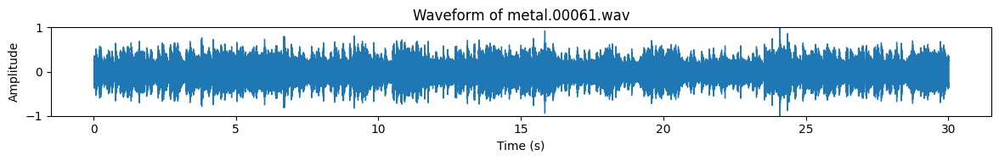

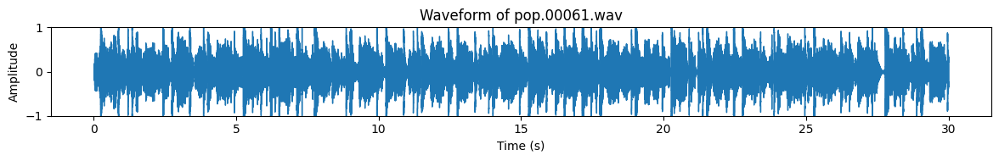

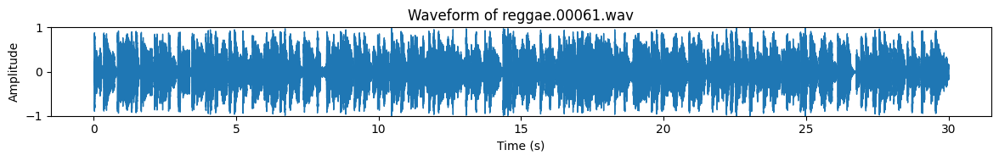

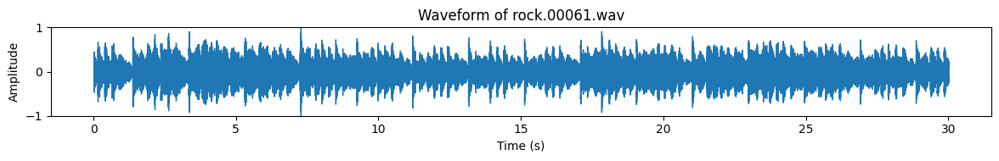

In [9]:
# Indices to plot
indices_to_plot = [60, 160, 260, 360, 460, 560, 660, 760, 860, 960]

# Loop through the indices
for idx in indices_to_plot:
    if idx < len(df):
        audio_path = os.path.join(base_folder_path, df.iloc[idx]['folder'], df.iloc[idx]['file_name'])
        
        # audio file
        data, sample_rate = librosa.load(audio_path, sr=None)
        
        # data is normalized to scale between -1 and 1
        data = data / max(abs(data))
        
        # audio player
        display(ipd.Audio(audio_path))
        
        # waveform
        plt.figure(figsize=(12, 2)) 
        librosa.display.waveshow(data, sr=sample_rate)
        plt.title(f'Waveform of {df.iloc[idx]["file_name"]}')
        plt.xlabel('Time (s)')
        plt.ylabel('Amplitude')
        
        
        plt.ylim([-1, 1])
        
        plt.tight_layout()
        plt.show()  

**MFCCs (Mel-frequency Cepstral Coefficients)** capture the power spectrum of an audio signal in a way that reflects how humans perceive sound. The process begins with pre-emphasis, where the high-frequency parts of the signal are amplified to compensate for the natural attenuation of higher frequencies in audio. The signal is then divided into small frames, typically 20-40 milliseconds long, to capture short-term changes in the sound. A window function, such as the Hamming window, is applied to reduce edge effects in these frames. Each frame undergoes a Fourier Transform, which converts the time-domain signal into the frequency domain. A Mel filter bank is then applied to the Fourier-transformed signal, with filters spaced according to the Mel scale to align with human perception of sound frequencies. The power of each filter output is calculated, and a logarithm is applied to compress the dynamic range. Finally, the log power spectrum is transformed into the cepstral domain using the Discrete Cosine Transform (DCT), reducing dimensionality and keeping only the most relevant coefficients for classification, known as MFCCs.


In [10]:
# Function to extract features (e.g., MFCC) from the audio file
def features_extractor(file_path):
    y, sr = librosa.load(file_path, sr=None)  # audio file
    mfccs = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=40)  # MFCC features
    return np.mean(mfccs.T, axis=0)  # Return the mean of the MFCC features

# empty list to store the extracted features
extracted_features = []

# Iterate through each row in df
for index_num, row in tqdm(df.iterrows()):
    # file path
    file_name = os.path.join(os.path.abspath(base_folder_path), row["folder"], row["file_name"])
    
    # folder as the label 
    final_class_labels = row["folder"]
    
    # features extraction from the audio file
    data = features_extractor(file_name)
    
    # Append the extracted features and corresponding label to the list
    extracted_features.append([data, final_class_labels])

# list of extracted features is converted to a DataFrame for easier analysis
extracted_features_df = pd.DataFrame(extracted_features, columns=['features', 'label'])

extracted_features_df.head()

999it [01:18, 12.67it/s]


,features,label
0,"[-113.59882, 121.57067, -19.162262, 42.36394, ...",Blues
1,"[-207.52383, 123.98514, 8.947019, 35.86715, 2....",Blues
2,"[-90.757164, 140.44087, -29.084547, 31.686693,...",Blues
3,"[-199.57513, 150.0861, 5.663404, 26.855278, 1....",Blues
4,"[-160.35417, 126.20948, -35.581394, 22.139256,...",Blues


In [11]:
# Randomized rows
randomized_df = extracted_features_df.sample(frac=1, random_state=42).reset_index(drop=True)
randomized_df.head()

,features,label
0,"[-144.9216, 66.675064, 44.269436, 22.51216, 6....",hiphop
1,"[-42.241444, 82.16851, -2.2273612, 19.91206, 1...",pop
2,"[12.145776, 58.997505, 0.9395953, 26.743252, 9...",country
3,"[-68.92688, 63.117622, -15.855327, 28.002327, ...",disco
4,"[-204.71895, 101.62684, 26.381647, 9.190344, 1...",pop


In [12]:
### dataset split into X and Y
X=np.array(randomized_df['features'].tolist())
y=np.array(randomized_df['label'].tolist())

In [13]:
X.shape

(999, 40)

In [14]:
y

array(['hiphop', 'pop', 'country', 'disco', 'pop', 'jazz', 'reggae',
       'jazz', 'hiphop', 'metal', 'rock', 'metal', 'reggae', 'metal',
       'pop', 'Blues', 'reggae', 'hiphop', 'disco', 'country', 'jazz',
       'disco', 'reggae', 'reggae', 'rock', 'Blues', 'classical',
       'country', 'reggae', 'disco', 'jazz', 'disco', 'metal', 'jazz',
       'metal', 'metal', 'classical', 'classical', 'metal', 'jazz', 'pop',
       'disco', 'rock', 'hiphop', 'classical', 'jazz', 'country', 'pop',
       'Blues', 'reggae', 'metal', 'jazz', 'rock', 'Blues', 'Blues',
       'disco', 'Blues', 'jazz', 'jazz', 'pop', 'Blues', 'metal',
       'reggae', 'jazz', 'pop', 'disco', 'jazz', 'pop', 'country',
       'reggae', 'Blues', 'classical', 'metal', 'classical', 'jazz',
       'rock', 'Blues', 'pop', 'jazz', 'rock', 'Blues', 'jazz', 'Blues',
       'reggae', 'disco', 'hiphop', 'metal', 'jazz', 'hiphop', 'hiphop',
       'disco', 'hiphop', 'reggae', 'jazz', 'pop', 'Blues', 'Blues',
       'reggae', 'm

In [15]:
y = np.array(pd.get_dummies(y))

In [16]:
y.shape

(999, 10)

In [17]:
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.25,random_state=98)

In [18]:
X_train.shape

(749, 40)

### 4 - Model Building

### 4.0 - First Model

In [19]:
### No of classes
num_labels=y.shape[1]
num_labels

10

In [20]:
model=Sequential()
###first layer
model.add(Dense(100,input_shape=(40,)))
model.add(Activation('relu'))
model.add(Dropout(0.5))
###second layer
model.add(Dense(200))
model.add(Activation('relu'))
model.add(Dropout(0.5))
###third layer
model.add(Dense(100))
model.add(Activation('relu'))
model.add(Dropout(0.5))

###final layer
model.add(Dense(num_labels))
model.add(Activation('softmax'))

In [21]:
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense (Dense)                        │ (None, 100)                 │           4,100 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation (Activation)              │ (None, 100)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 100)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 200)                 │          20,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_1 (Activation)            │ (None, 200)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 200)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 100)                 │          20,100 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_2 (Activation)            │ (None, 100)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_2 (Dropout)                  │ (None, 100)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 10)                  │           1,010 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_3 (Activation)            │ (None, 10)                  │               0 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 45,410 (177.38 KB)

 Trainable params: 45,410 (177.38 KB)

 Non-trainable params: 0 (0.00 B)

In [22]:
model.compile(loss='categorical_crossentropy',metrics=['accuracy'],optimizer='adam')

In [23]:
## Trianing 
from tensorflow.keras.callbacks import ModelCheckpoint
from datetime import datetime 

num_epochs = 50
num_batch_size = 32

checkpointer = ModelCheckpoint(filepath=r'C:\Users\manue\Desktop\DataScience\Audio\genres_original\best_model.keras', 
                               verbose=1, save_best_only=True)
start = datetime.now()

model.fit(X_train, y_train, batch_size=num_batch_size, epochs=num_epochs, validation_data=(X_test, y_test), callbacks=[checkpointer], verbose=1)


duration = datetime.now() - start
print("Training completed in time: ", duration)

Epoch 1/50
16/24 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.1058 - loss: 40.1516
Epoch 1: val_loss improved from inf to 2.90034, saving model to C:\Users\manue\Desktop\DataScience\Audio\genres_original\best_model.keras
24/24 ━━━━━━━━━━━━━━━━━━━━ 3s 19ms/step - accuracy: 0.1059 - loss: 36.6855 - val_accuracy: 0.1160 - val_loss: 2.9003
Epoch 2/50
19/24 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.1090 - loss: 15.1983 
Epoch 2: val_loss improved from 2.90034 to 2.14356, saving model to C:\Users\manue\Desktop\DataScience\Audio\genres_original\best_model.keras
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.1116 - loss: 14.8121 - val_accuracy: 0.1960 - val_loss: 2.1436
Epoch 3/50
21/24 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.1565 - loss: 9.1468 
Epoch 3: val_loss did not improve from 2.14356
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.1552 - loss: 9.0193 - val_accuracy: 0.1760 - val_loss: 2.1537
Epoch 4/50
21/24 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.1306 

In [24]:
test_accuracy=model.evaluate(X_test,y_test,verbose=0)
print(test_accuracy[1])

0.36000001430511475


In [25]:
# Store of results
results_df = pd.DataFrame(columns=['Model', 'Accuracy'])
new_row = pd.DataFrame([{'Model': 'First Model', 'Accuracy': test_accuracy[1]}])
results_df = pd.concat([results_df, new_row], ignore_index=True)
results_df.head(10)

,Model,Accuracy
0,First Model,0.36


Even though the loss decreases, the accuracy remains very low which indicates that the model is struggling to learn patterns from the data. 
The validation loss does not improve significantly from around Epoch 3 to Epoch 23, staying in the range of 2.0 to 2.18. This suggests the model is not generalizing well, potentially indicating overfitting.

### 4.1 - Second Model

In this model, batch normalization was used, which improves training speed and stability, making it easier to train deep networks by normalizing layer inputs. It normalizes the output of each layer which helps to stabilize and speed up the training process and is also normalizes the input to have a mean of zero and a variance of one, which helps in reducing the internal covariate shift.

Early Stopping helps avoid overfitting and optimizes training efficiency by stopping the training process once the model stops improving on the validation dataset.

In [26]:
epochs1=100

#  model building
model = Sequential()

# First layer
model.add(Dense(128, input_shape=(40,)))  # Increased units
model.add(BatchNormalization())  # Batch normalization
model.add(Activation('relu'))
model.add(Dropout(0.5))

# Second layer
model.add(Dense(256))  # Increased units
model.add(BatchNormalization())  # Batch normalization
model.add(Activation('relu'))
model.add(Dropout(0.5))

# Third layer
model.add(Dense(128))  # Increased units
model.add(BatchNormalization())  # Batch normalization
model.add(Activation('relu'))
model.add(Dropout(0.5))

# Final layer
model.add(Dense(10))  # Adjusted to match the output classes
model.add(Activation('softmax'))  # softmax for multi-class classification

# Compile the model
model.compile(optimizer='adam',
              loss='categorical_crossentropy',  # categorical crossentropy for one-hot encoded labels
              metrics=['accuracy'])

# callbacks
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# model training
history = model.fit(X_train, y_train,
                    batch_size=num_batch_size,
                    epochs=epochs1,
                    validation_data=(X_test, y_test),
                    callbacks=[early_stopping],
                    verbose=1)

Epoch 1/100
24/24 ━━━━━━━━━━━━━━━━━━━━ 8s 33ms/step - accuracy: 0.1031 - loss: 2.8954 - val_accuracy: 0.0800 - val_loss: 4.3127
Epoch 2/100
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.1973 - loss: 2.3147 - val_accuracy: 0.1320 - val_loss: 3.9992
Epoch 3/100
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.3106 - loss: 1.9820 - val_accuracy: 0.1920 - val_loss: 2.9725
Epoch 4/100
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.3007 - loss: 2.0213 - val_accuracy: 0.2360 - val_loss: 2.3492
Epoch 5/100
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.3165 - loss: 1.9053 - val_accuracy: 0.3000 - val_loss: 2.0779
Epoch 6/100
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.3482 - loss: 1.7936 - val_accuracy: 0.3280 - val_loss: 1.8659
Epoch 7/100
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.3345 - loss: 1.8143 - val_accuracy: 0.3560 - val_loss: 1.7348
Epoch 8/100
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.3535 - loss: 1.7669 - val_accuracy: 0.3760 

In [27]:
test_accuracy2=model.evaluate(X_test,y_test,verbose=0)
print(test_accuracy2[1])

0.6240000128746033


In [28]:
new_row = pd.DataFrame([{'Model': 'Second Model', 'Accuracy': test_accuracy2[1]}])
results_df = pd.concat([results_df, new_row], ignore_index=True)
results_df.head()

,Model,Accuracy
0,First Model,0.360
1,Second Model,0.624


### 4.2 - Third Model

This model has the following features:

Convolutional Layers are designed for spatial feature extraction and local connectivity, making them ideal for image data.

Flattening is necessary to convert multi-dimensional outputs into a format compatible with dense layers, enabling the model to learn from the features extracted by the convolutional layers.After convolutional and pooling layers, the output is usually a multi-dimensional tensor (for example, a 3D tensor for image data). Dense layers expect a 1D vector as input, so the output must be flattened to meet this requirement.Flattening retains all the features learned in the previous layers while restructuring the data into a format suitable for dense processing. It helps transition from local feature extraction (convolutional layers) to global reasoning (dense layers).

Dense Layers connect every neuron to every neuron in the previous layer, allowing for global feature integration and decision making. Each neuron in a dense layer receives input from all neurons in the previous layer, allowing it to capture global patterns but at the cost of increased complexity.

In [29]:
epochs1 = 100

# model building
model = Sequential()

# Convolutional Layer for feature extraction
model.add(Conv1D(64, kernel_size=3, activation='relu', input_shape=(40, 1)))  
model.add(MaxPooling1D(pool_size=2))
model.add(Dropout(0.3))

# Additional Convolutional Layer
model.add(Conv1D(128, kernel_size=3, activation='relu'))
model.add(MaxPooling1D(pool_size=2))
model.add(Dropout(0.3))

# output is flatenned
model.add(Flatten())

# Dense Layers for classification
model.add(Dense(256))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(Dropout(0.5))

model.add(Dense(128))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(Dropout(0.5))

# Final Layer
model.add(Dense(10))  
model.add(Activation('softmax'))  # Softmax for multi-class classification

# Compile the model
model.compile(optimizer='adam',
              loss='categorical_crossentropy',  # categorical crossentropy for one-hot encoded labels
              metrics=['accuracy'])

# callbacks
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, min_lr=1e-6)

# Train 
history = model.fit(X_train, y_train,
                    batch_size=num_batch_size,
                    epochs=epochs1,
                    validation_data=(X_test, y_test),
                    callbacks=[early_stopping, reduce_lr],
                    verbose=1)

Epoch 1/100
24/24 ━━━━━━━━━━━━━━━━━━━━ 6s 35ms/step - accuracy: 0.1469 - loss: 2.8395 - val_accuracy: 0.1680 - val_loss: 3.2057 - learning_rate: 0.0010
Epoch 2/100
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - accuracy: 0.2603 - loss: 2.3449 - val_accuracy: 0.1600 - val_loss: 2.9374 - learning_rate: 0.0010
Epoch 3/100
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - accuracy: 0.2730 - loss: 2.1602 - val_accuracy: 0.1920 - val_loss: 2.5823 - learning_rate: 0.0010
Epoch 4/100
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - accuracy: 0.2726 - loss: 2.1345 - val_accuracy: 0.2840 - val_loss: 2.1514 - learning_rate: 0.0010
Epoch 5/100
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.2875 - loss: 2.0506 - val_accuracy: 0.3000 - val_loss: 2.0578 - learning_rate: 0.0010
Epoch 6/100
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.3382 - loss: 1.8505 - val_accuracy: 0.3560 - val_loss: 1.8503 - learning_rate: 0.0010
Epoch 7/100
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.3886 - loss: 1.7388 - 

In [30]:
test_accuracy3=model.evaluate(X_test,y_test,verbose=0)
print(test_accuracy3[1])

0.5720000267028809


In [31]:
new_row = pd.DataFrame([{'Model': 'Third Model', 'Accuracy': test_accuracy3[1]}])
results_df = pd.concat([results_df, new_row], ignore_index=True)
results_df.head()

,Model,Accuracy
0,First Model,0.360
1,Second Model,0.624
2,Third Model,0.572


### 4.3 - Fourth Model

In [32]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Activation, Dropout, BatchNormalization, LeakyReLU
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint
from tensorflow.keras.regularizers import l2
from sklearn.preprocessing import StandardScaler

# Preprocess the data
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# Build the model
model = Sequential()
model.add(Dense(128, input_shape=(40,), kernel_regularizer=l2(0.001)))  # L2 regularization
model.add(BatchNormalization())
model.add(LeakyReLU(alpha=0.1))  # LeakyReLU activation
model.add(Dropout(0.5))

model.add(Dense(256))
model.add(BatchNormalization())
model.add(LeakyReLU(alpha=0.1))
model.add(Dropout(0.5))

model.add(Dense(128))
model.add(BatchNormalization())
model.add(LeakyReLU(alpha=0.1))
model.add(Dropout(0.5))

model.add(Dense(10, activation='softmax'))  # Output layer

# Compile the model
model.compile(optimizer='adam',
              loss='categorical_crossentropy',  # Use categorical crossentropy for one-hot encoded labels
              metrics=['accuracy'])

# Define callbacks
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, min_lr=1e-6)
model_checkpoint = ModelCheckpoint(r'C:\Users\manue\Desktop\DataScience\Audio\genres_original\best_model3.keras', save_best_only=True)

# Train the model
history = model.fit(X_train, y_train,
                    batch_size=num_batch_size,
                    epochs=100,
                    validation_data=(X_test, y_test),
                    callbacks=[early_stopping, reduce_lr, model_checkpoint],
                    verbose=1)


Epoch 1/100
24/24 ━━━━━━━━━━━━━━━━━━━━ 6s 33ms/step - accuracy: 0.1269 - loss: 2.9357 - val_accuracy: 0.3000 - val_loss: 2.1385 - learning_rate: 0.0010
Epoch 2/100
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - accuracy: 0.1967 - loss: 2.4933 - val_accuracy: 0.3320 - val_loss: 1.9880 - learning_rate: 0.0010
Epoch 3/100
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.2571 - loss: 2.2670 - val_accuracy: 0.3360 - val_loss: 1.8848 - learning_rate: 0.0010
Epoch 4/100
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - accuracy: 0.3587 - loss: 1.9615 - val_accuracy: 0.3720 - val_loss: 1.7956 - learning_rate: 0.0010
Epoch 5/100
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - accuracy: 0.3448 - loss: 1.9528 - val_accuracy: 0.4120 - val_loss: 1.7212 - learning_rate: 0.0010
Epoch 6/100
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - accuracy: 0.4171 - loss: 1.8083 - val_accuracy: 0.4400 - val_loss: 1.6726 - learning_rate: 0.0010
Epoch 7/100
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - accuracy: 0.3636 - loss: 1.8369 - val

In [33]:
test_accuracy4=model.evaluate(X_test,y_test,verbose=0)
print(test_accuracy4[1])

0.6159999966621399


In [34]:
new_row = pd.DataFrame([{'Model': 'Fourth Model', 'Accuracy': test_accuracy4[1]}])
results_df = pd.concat([results_df, new_row], ignore_index=True)
results_df.head()

,Model,Accuracy
0,First Model,0.360
1,Second Model,0.624
2,Third Model,0.572
3,Fourth Model,0.616


### 4.4 - Model with Chroma, Spectral Contrast and Tonnetz

Chroma Features: represent the energy distribution of pitches (or notes) in an audio signal, focusing on the 12 distinct semitones of the octave.

Spectral Contrast: measures the difference in amplitude between peaks and valleys in a sound spectrum, indicating the timbral texture of audio.

Tonnetz (Tonal Centroid Features): represent the harmonic relations and tonal centroid features of the audio signal, focusing on the relationships between pitch classes.

Benefits:

* Feature Diversity: Combining these features provides a richer representation of the audio signal, allowing the neural network to learn complex patterns and relationships within the data.
  
* Improved Classification Accuracy: By leveraging these features, the neural network can achieve better performance in classifying audio signals, whether it’s music genres, instrument types, or speech categories.

* Dimensionality Reduction: These features can help reduce the dimensionality of the input data while retaining essential information, making the learning process more efficient and effective.

In [35]:
audio_directory = r'C:\Users\manue\Desktop\DataScience\Audio\genres_original'

# Function to extract audio features
def extract_audio_features(file_name):
    # Extract the genre from the file name
    genre = file_name.split('.')[0]  # This assumes the format is 'genre.XXXX.wav'
    full_path = f"{audio_directory}\\{genre}\\{file_name}"
    
    # Load 
    y, sr = librosa.load(full_path, sr=22050)
    
    # Extract features
    chroma = librosa.feature.chroma_stft(y=y, sr=sr)
    spectral_contrast = librosa.feature.spectral_contrast(y=y, sr=sr)
    tonnetz = librosa.feature.tonnetz(y=y, sr=sr)

    # Average features over time
    chroma_mean = np.mean(chroma, axis=1)
    spectral_contrast_mean = np.mean(spectral_contrast, axis=1)
    tonnetz_mean = np.mean(tonnetz, axis=1)

    return chroma_mean, spectral_contrast_mean, tonnetz_mean

# Apply the function to each file_name in the DataFrame
df[['chroma', 'spectral_contrast', 'tonnetz']] = df['file_name'].apply(lambda x: pd.Series(extract_audio_features(x)))

df.head()

,file_name,folder,chroma,spectral_contrast,tonnetz
0,blues.00000.wav,Blues,"[0.36224285, 0.367817, 0.43983436, 0.24469176,...","[15.986115582904988, 15.098203280233077, 18.45...","[0.026547704102480862, 0.01822476800750899, 0...."
1,blues.00001.wav,Blues,"[0.46004024, 0.35018244, 0.32080683, 0.2114715...","[15.984938219468534, 17.059629950728368, 19.13...","[0.035599953887343085, 0.08444512365196676, 0...."
2,blues.00002.wav,Blues,"[0.27290025, 0.19595265, 0.31516543, 0.4079861...","[26.345502763614213, 14.1918816655083, 17.7019...","[0.12009990652812318, -0.06507467075974958, 0...."
3,blues.00003.wav,Blues,"[0.34137163, 0.40862364, 0.52431905, 0.5470128...","[29.784038278808787, 14.76604254261303, 17.238...","[0.10202878193816245, -0.06180685030177775, 0...."
4,blues.00004.wav,Blues,"[0.1926048, 0.31726655, 0.39202207, 0.25582698...","[17.055249292784442, 15.693600776805484, 19.13...","[-0.005247705615808398, 0.0606726536469679, -0..."


In [36]:
first_row_values = df.loc[0, ['chroma', 'spectral_contrast', 'tonnetz']]
print(first_row_values)

chroma               [0.36224285, 0.367817, 0.43983436, 0.24469176,...
spectral_contrast    [15.986115582904988, 15.098203280233077, 18.45...
tonnetz              [0.026547704102480862, 0.01822476800750899, 0....
Name: 0, dtype: object


In [37]:
X = df[['chroma', 'spectral_contrast', 'tonnetz']]
y = df['folder']

In [38]:
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.25,random_state=98)

In [39]:
# data is flatenned
X_train_flattened = np.array([np.concatenate([chroma, spectral_contrast, tonnetz]) for chroma, spectral_contrast, tonnetz in zip(X_train['chroma'], X_train['spectral_contrast'], X_train['tonnetz'])])
X_test_flattened = np.array([np.concatenate([chroma, spectral_contrast, tonnetz]) for chroma, spectral_contrast, tonnetz in zip(X_test['chroma'], X_test['spectral_contrast'], X_test['tonnetz'])])

# Encode labels to integers
label_encoder = LabelEncoder()
y_train_encoded = label_encoder.fit_transform(y_train)
y_test_encoded = label_encoder.transform(y_test)

# Normalized features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train_flattened)
X_test_scaled = scaler.transform(X_test_flattened)

# neural network model
model = keras.Sequential([
    layers.Input(shape=(X_train_scaled.shape[1],)),  # Number of features
    layers.Dense(64, activation='relu'),
    layers.Dense(32, activation='relu'),
    layers.Dense(len(np.unique(y_train_encoded)), activation='softmax')  # Number of classes
])

# Compile the model
model.compile(optimizer='adam', 
              loss='sparse_categorical_crossentropy', 
              metrics=['accuracy'])

# model training
model.fit(X_train_scaled, y_train_encoded, epochs=50, batch_size=8, validation_split=0.2)

# model evaluation
loss, accuracy5 = model.evaluate(X_test_scaled, y_test_encoded)
print(f'Loss: {loss}, Accuracy: {accuracy5}')

# predictions
predictions = model.predict(X_test_scaled)
predicted_classes = label_encoder.inverse_transform(np.argmax(predictions, axis=1))
print(predicted_classes)

Epoch 1/50
75/75 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.2015 - loss: 2.2077 - val_accuracy: 0.2667 - val_loss: 1.9639
Epoch 2/50
75/75 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3419 - loss: 1.8076 - val_accuracy: 0.3133 - val_loss: 1.7850
Epoch 3/50
75/75 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4121 - loss: 1.6713 - val_accuracy: 0.3933 - val_loss: 1.6869
Epoch 4/50
75/75 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4307 - loss: 1.5753 - val_accuracy: 0.4267 - val_loss: 1.5906
Epoch 5/50
75/75 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5377 - loss: 1.4098 - val_accuracy: 0.4000 - val_loss: 1.5551
Epoch 6/50
75/75 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5675 - loss: 1.2645 - val_accuracy: 0.4800 - val_loss: 1.4864
Epoch 7/50
75/75 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6170 - loss: 1.2169 - val_accuracy: 0.4867 - val_loss: 1.4281
Epoch 8/50
75/75 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5835 - loss: 1.2605 - val_accuracy: 0.4800 - val_loss:

In [40]:
new_row = pd.DataFrame([{'Model': 'Model with Chroma, Spectral Contrast and Tonnetzl', 'Accuracy': accuracy5}])
results_df = pd.concat([results_df, new_row], ignore_index=True)
results_df.head(15)

,Model,Accuracy
0,First Model,0.360
1,Second Model,0.624
2,Third Model,0.572
3,Fourth Model,0.616
4,"Model with Chroma, Spectral Contrast and Tonnetzl",0.476


### 4.5 - Model with Chroma, Spectral Contrast,Tonnetz and regularization 

Regularization is applied to avoid overfitting

In [42]:
# model
model = keras.Sequential([
    layers.Input(shape=(X_train_scaled.shape[1],)),
    layers.Dense(256, activation='relu', kernel_regularizer=regularizers.l2(0.01)),  
    layers.BatchNormalization(),
    layers.Dropout(0.3),
    layers.Dense(128, activation='relu', kernel_regularizer=regularizers.l2(0.01)),  
    layers.BatchNormalization(),
    layers.Dropout(0.3),
    layers.Dense(64, activation='relu', kernel_regularizer=regularizers.l2(0.01)),
    layers.BatchNormalization(),
    layers.Dropout(0.3),
    layers.Dense(32, activation='relu', kernel_regularizer=regularizers.l2(0.01)),
    layers.Dropout(0.3),
    layers.Dense(len(np.unique(y_train_encoded)), activation='softmax')  # Output layer
])

# Model Compilation
model.compile(optimizer='adam', 
              loss='sparse_categorical_crossentropy', 
              metrics=['accuracy'])

from keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau

from keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau

# Callbacks
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
model_checkpoint = ModelCheckpoint('best_model.keras', monitor='val_loss', save_best_only=True)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=5, min_lr=1e-6)

# model fitting
history = model.fit(X_train_scaled, 
                    y_train_encoded,
                    epochs=100,
                    callbacks=[early_stopping, model_checkpoint, reduce_lr])

# Model Evaluation
loss, accuracy6 = model.evaluate(X_test_scaled, y_test_encoded)
print(f'Loss: {loss}, Accuracy: {accuracy6}')

Epoch 1/100
24/24 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - accuracy: 0.0840 - loss: 6.6232 - learning_rate: 0.0010
Epoch 2/100
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.1443 - loss: 5.8742 - learning_rate: 0.0010
Epoch 3/100
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2217 - loss: 5.5437 - learning_rate: 0.0010
Epoch 4/100
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2838 - loss: 5.1948 - learning_rate: 0.0010
Epoch 5/100
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.2791 - loss: 5.1075 - learning_rate: 0.0010
Epoch 6/100
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.3090 - loss: 4.8572 - learning_rate: 0.0010
Epoch 7/100
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.3149 - loss: 4.6819 - learning_rate: 0.0010
Epoch 8/100
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.3261 - loss: 4.5307 - learning_rate: 0.0010
Epoch 9/100
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.3440 - loss: 4.3662 - learning_rate: 0.0010
Epoch 10/100
24/24 

In [43]:
new_row = pd.DataFrame([{'Model': 'Model with Chroma, Spectral Contrast,Tonnetz and regularization', 'Accuracy': accuracy6}])
results_df = pd.concat([results_df, new_row], ignore_index=True)
results_df.head(15)

,Model,Accuracy
0,First Model,0.360
1,Second Model,0.624
2,Third Model,0.572
3,Fourth Model,0.616
4,"Model with Chroma, Spectral Contrast and Tonnetzl",0.476
5,"Model with Chroma, Spectral Contrast,Tonnetz a...",0.524


### 4.6 - Model with Spectogram

Extracting the spectograms from the audio can be benefitial because it converts an audio signal from the time domain into a visual representation in the time-frequency domain. 

This allows:

* Frequency Information: Audio signals, especially speech or music, often contain important frequency patterns that are not obvious in raw waveform data
* Temporal Features: The visual representation in a spectrogram highlights time-dependent features, which are crucial for tasks like speech recognition, environmental sound classification, or music genre identification.
* Noise Robustness: Spectrograms allow machine learning models to focus on meaningful frequency bands while filtering out irrelevant noise
* Dimensionality Reduction: A spectrogram condenses the raw audio data into a manageable form, reducing the complexity of the input without losing important information.

In [44]:
import os

def is_utf8(file_path):
    try:
        with open(file_path, 'rb') as f:  # Open the file in binary mode
            f.read().decode('utf-8')  # Attempt to decode as UTF-8
        return True  # If decoding succeeds, it's UTF-8
    except (UnicodeDecodeError, FileNotFoundError):
        return False  # If there's an error, it's not UTF-8

audio_path = r'C:\Users\manue\Desktop\DataScience\Audio\genres_original'

# Traverse through the audio directory
for genre_folder in os.listdir(audio_path):
    genre_path = os.path.join(audio_path, genre_folder)
    if os.path.isdir(genre_path):  # Ensure it's a directory
        for filename in os.listdir(genre_path):
            file_path = os.path.join(genre_path, filename)
            if os.path.isfile(file_path):  # Ensure it's a file
                if is_utf8(file_path):  # Check if it's UTF-8 encoded
                    print(f"{file_path} is UTF-8 encoded.")

In [45]:
# path 
audio_path = r'C:\Users\manue\Desktop\DataScience\Audio\genres_original'

# audio dataset as a keras dataset
dataset = tf.keras.utils.audio_dataset_from_directory(
    audio_path,                      # Root directory 
    batch_size=32,                  
    shuffle=True,                   
    seed=42                         # Seed for reproducibility
)

# first batch of data
for audio, label in dataset.take(1):
    print("Audio shape:", audio.shape)  # Shape of the audio tensors
    print("Label shape:", label.shape)  # Shape of the label tensors

Found 1000 files belonging to 10 classes.
Audio shape: (32, 667920, 1)
Label shape: (32,)


In [46]:
# Function to convert audio to spectrogram
def audio_to_spectrogram(audio):
    audio = tf.squeeze(audio)  
    spectrogram = tf.signal.stft(audio, frame_length=256, frame_step=128)
    return tf.abs(spectrogram)

# Preprocessing to convert audio to spectrograms
def preprocess_dataset(dataset):
    def map_function(audio, label):
        spectrogram = audio_to_spectrogram(audio)
        print("Spectrogram shape:", spectrogram.shape)  # shape of spectrogram
        return spectrogram, label
    
    return dataset.map(map_function)

# Process the dataset
processed_dataset = preprocess_dataset(dataset)

for spectrogram, label in processed_dataset.take(1):
    print("Processed spectrogram shape:", spectrogram.shape)  # Shape of the spectrogram tensors
    print("Label shape:", label.shape)                       # Shape of the label tensors

Spectrogram shape: <unknown>
Processed spectrogram shape: (32, 5217, 129)
Label shape: (32,)


Label: [5 2 1 0 8 2 5 1 4 0 2 4 1 9 0 2 9 3 7 1 7 9 0 4 2 3 7 6 5 1 9 6]


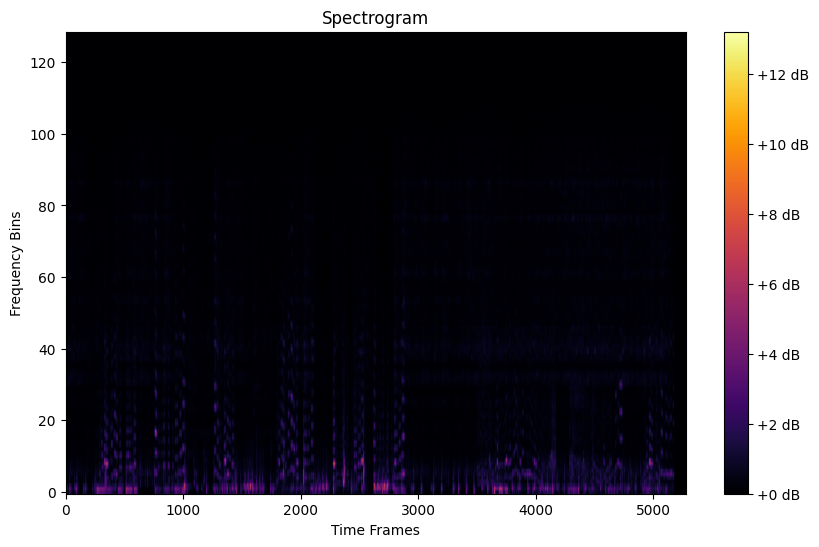

In [47]:
# spectrogram visualization
def plot_spectrogram(spectrogram, title="Spectrogram"):
    # Convert Tensor to Numpy array
    spectrogram = tf.transpose(spectrogram)  # Transpose for better visual alignment
    spectrogram_np = spectrogram.numpy()     # Convert tensor to numpy for plotting
    plt.figure(figsize=(10, 6))
    plt.imshow(spectrogram_np, aspect='auto', origin='lower', cmap='inferno')
    plt.colorbar(format='%+2.0f dB')
    plt.title(title)
    plt.xlabel("Time Frames")
    plt.ylabel("Frequency Bins")
    plt.show()

# Display the first spectrogram from the dataset
for spectrogram, label in processed_dataset.take(1):
    print(f"Label: {label.numpy()}")
    plot_spectrogram(spectrogram[0])

In [48]:
len(processed_dataset)

32

In [49]:
train = processed_dataset.take(24)
test = processed_dataset.skip(24).take(8)

In [50]:
samples, labels = train.as_numpy_iterator().next()

In [51]:
samples.shape

(32, 5278, 129)

In [55]:
# path
audio_path = r'C:\Users\manue\Desktop\DataScience\Audio\genres_original'
target_length = 512  # target length for spectrograms

# Function to load audio files and convert them to spectrograms
def load_audio_file(file_path):
    # Load audio file using pydub
    audio = AudioSegment.from_file(file_path)
    samples = np.array(audio.get_array_of_samples())

    # Convert samples to float32 and normalize the audio signal
    samples = samples.astype(np.float32)
    samples /= np.max(np.abs(samples))

    # Convert audio to spectrogram
    spectrogram = librosa.stft(samples)
    spectrogram_magnitude = np.abs(spectrogram)

    # Normalize the spectrogram values between 0 and 1
    spectrogram_magnitude = spectrogram_magnitude / np.max(spectrogram_magnitude)

    # Pad or truncate spectrogram to fixed length
    if spectrogram_magnitude.shape[1] < target_length:
        padding = target_length - spectrogram_magnitude.shape[1]
        spectrogram_magnitude = np.pad(spectrogram_magnitude, ((0, 0), (0, padding)), mode='constant')
    else:
        spectrogram_magnitude = spectrogram_magnitude[:, :target_length]

    return spectrogram_magnitude

# Create dataset from audio files
def create_dataset(audio_path):
    dataset = []
    labels = []
    for genre in os.listdir(audio_path):
        genre_path = os.path.join(audio_path, genre)
        if os.path.isdir(genre_path):
            for file in os.listdir(genre_path):
                file_path = os.path.join(genre_path, file)
                if file_path.endswith('.wav'):
                    try:
                        spectrogram = load_audio_file(file_path)
                        dataset.append(spectrogram)
                        labels.append(genre)
                    except Exception as e:
                        print(f"Error loading {file_path}: {e}")
    return np.array(dataset), np.array(labels)

# Load the dataset
X, y = create_dataset(audio_path)

# Encode labels to integers
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y)

# One-hot encode the labels
y_encoded = tf.keras.utils.to_categorical(y_encoded)

# Split the dataset into training and validation sets
X_train, X_val, y_train, y_val = train_test_split(X, y_encoded, test_size=0.2, random_state=42)

# Expand dimensions for TensorFlow compatibility
X_train = np.expand_dims(X_train, axis=-1)
X_val = np.expand_dims(X_val, axis=-1)

# TensorFlow datasets
train_dataset = tf.data.Dataset.from_tensor_slices((X_train, y_train)).batch(32)
val_dataset = tf.data.Dataset.from_tensor_slices((X_val, y_val)).batch(32)

# improved model with reduced Dropout, Batch Normalization, and modified architecture
def create_improved_model(input_shape, num_classes):
    model = models.Sequential()

    # First Convolutional Block
    model.add(layers.Conv2D(32, (3, 3), activation='relu', input_shape=input_shape))
    model.add(layers.MaxPooling2D((2, 2)))
    model.add(layers.BatchNormalization())

    # Second Convolutional Block
    model.add(layers.Conv2D(64, (3, 3), activation='relu'))
    model.add(layers.MaxPooling2D((2, 2)))
    model.add(layers.BatchNormalization())

    # Third Convolutional Block
    model.add(layers.Conv2D(128, (3, 3), activation='relu'))
    model.add(layers.MaxPooling2D((2, 2)))
    model.add(layers.BatchNormalization())

    # Fourth Convolutional Block
    model.add(layers.Conv2D(256, (3, 3), activation='relu'))
    model.add(layers.MaxPooling2D((2, 2)))
    model.add(layers.BatchNormalization())

    # Flatten and Dense layers
    model.add(layers.Flatten())
    model.add(layers.Dense(256, activation='relu'))
    model.add(layers.Dropout(0.3))  # Reduce dropout to 0.3

    # Output layer for multi-class classification
    model.add(layers.Dense(num_classes, activation='softmax'))

    return model

# model creation
input_shape = (X_train.shape[1], X_train.shape[2], 1)  # Add channel dimension
num_classes = y_train.shape[1]  # Number of classes
model = create_improved_model(input_shape, num_classes)

model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

# Define callbacks
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
reduce_lr = tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=3, verbose=1)

# model training
history = model.fit(train_dataset, 
                    validation_data=val_dataset, 
                    epochs=5, 
                    callbacks=[early_stopping, reduce_lr])

# Model Evaluation
loss, accuracy6 = model.evaluate(X_val, y_test_encoded)
print(f'Loss: {loss}, Accuracy: {accuracy6}')

Error loading C:\Users\manue\Desktop\DataScience\Audio\genres_original\jazz\jazz.00054.wav: [WinError 2] Das System kann die angegebene Datei nicht finden
Epoch 1/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 1813s 71s/step - accuracy: 0.2181 - loss: 12.7193 - val_accuracy: 0.0950 - val_loss: 2.7230 - learning_rate: 1.0000e-04
Epoch 2/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 1503s 59s/step - accuracy: 0.5508 - loss: 1.2403 - val_accuracy: 0.0950 - val_loss: 3.1851 - learning_rate: 1.0000e-04
Epoch 3/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 1758s 68s/step - accuracy: 0.7640 - loss: 0.6922 - val_accuracy: 0.0950 - val_loss: 3.2159 - learning_rate: 1.0000e-04
Epoch 4/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 66s/step - accuracy: 0.8757 - loss: 0.3785  
Epoch 4: ReduceLROnPlateau reducing learning rate to 9.999999747378752e-06.
25/25 ━━━━━━━━━━━━━━━━━━━━ 1762s 69s/step - accuracy: 0.8747 - loss: 0.3804 - val_accuracy: 0.0600 - val_loss: 3.9152 - learning_rate: 1.0000e-04
Epoch 5/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 1681s 65s/step - accuracy: 0.906

ValueError: Data cardinality is ambiguous. Make sure all arrays contain the same number of samples.'x' sizes: 200
'y' sizes: 250


In [57]:
# Model Evaluation
loss, accuracy7 = model.evaluate(X_val, y_val)
print(f'Loss: {loss}, Accuracy: {accuracy7}')

7/7 ━━━━━━━━━━━━━━━━━━━━ 70s 10s/step - accuracy: 0.0960 - loss: 2.7455
Loss: 2.7229526042938232, Accuracy: 0.0949999988079071


In [58]:
new_row = pd.DataFrame([{'Model': 'Model with Spectogram', 'Accuracy': accuracy7}])
results_df = pd.concat([results_df, new_row], ignore_index=True)
results_df.head(15)

,Model,Accuracy
0,First Model,0.360
1,Second Model,0.624
2,Third Model,0.572
3,Fourth Model,0.616
4,"Model with Chroma, Spectral Contrast and Tonnetzl",0.476
5,"Model with Chroma, Spectral Contrast,Tonnetz a...",0.524
6,Model with Spectogram,0.095


For some reason that I am unable to tell, the last model performed worst than random guessing.

## 5 - Best Model Selection

The model that performed the best was the second model, reaching a **0,62%** in accuracy, and is the model that better handles the problem of overfitting (which is possible to see by comparing training and validation accuracy).

The model arquitecture is the following:

* Input Layer, which a shape of (40,)
* First Layer: It is a dende layer that has 128 neurons, which helps capture patterns from the input data. Batch Normalization to stabilize and accelerate training is done, as well as ReLu Activation so the model learns complex patters by introducing non-linearity and Dropout of 0,5 for regularization.
* Second Layer: Same as before, but this time with 256 units to capture more complex interactions.
* Third Layer: with 128 units, reduced neuron count from the second layer to refine learned patterns.
* Final Layer: It is a dense layer with 10 units, needed to match the 10 output classes, and uses softmax activation which converts the output to probabilities for multi-class classification.

For compilation and training, Adam optimizer is chosen, which is effective for many problems due to its adaptive learning rate and for the loss function, categorical cross-entropy, suitable for multi-class problems with one-hot encoded labels.

The Early Stopping Callback is implemented as well to monitor validation loss, and if it doesn’t improve for 10 epochs, training stops early. It also restores the best weights, avoiding overfitting.

A Second Jupyter notebook will be conducted, where only this model makes predictions. It would have been better to do it here, but unfortunately I did not plan it well enough, as I called all the models simply "model", so to redundancy by coding this neural network again, or correcting and running it all again, which due to the last 